In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score, confusion_matrix
%matplotlib inline

from sklearn.feature_extraction.text import CountVectorizer  #DT does not take strings as input for the model fit step....

In [2]:
df = pd.read_csv(r'E:\Code_Vauld\IOT_GEN_PLOT2\1m8c8s8L_AutoMan_Anomaly\sensor_IOT_ok.csv')
df.tail(5)

,TS,xs1,xs2,xs3,xs4,xs5,xs6,xs7,xs8,label
11143,03/09/2022 05:30:38 PM,22.360545,62.441708,614.275778,91.316984,111.261258,337.652206,608.626105,93.236732,0
11144,03/09/2022 05:30:39 PM,22.378963,60.832924,615.603485,90.670284,111.390261,338.368133,614.853440,92.449471,3
11145,03/09/2022 05:30:40 PM,22.115642,61.879360,603.981455,92.154777,111.429463,335.943793,619.911271,93.524759,0
11146,03/09/2022 05:30:41 PM,21.294801,60.977528,606.264567,92.715570,111.441063,339.222134,601.457418,92.225605,0
11147,03/09/2022 05:30:42 PM,21.655784,60.989786,602.392391,92.910869,111.520200,333.786280,601.532498,91.121459,0


In [3]:
df  = df.drop(['TS'], axis=1)

In [4]:
df.dtypes

xs1      float64
xs2      float64
xs3      float64
xs4      float64
xs5      float64
xs6      float64
xs7      float64
xs8      float64
label      int64
dtype: object

In [5]:
df.shape

(11148, 9)

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
xs1,11148.0,21.548970,0.583528,20.550409,21.052107,21.537718,22.045423,27.839009
xs2,11148.0,61.546329,0.593023,60.550082,61.036585,61.547124,62.039461,66.873661
xs3,11148.0,610.536744,5.827490,600.551494,605.581675,610.432560,615.454066,672.973467
xs4,11148.0,92.067083,0.891504,90.550414,91.310898,92.071592,92.821380,99.324656
xs5,11148.0,111.045578,0.288501,110.550006,110.795257,111.046586,111.291546,111.549988
xs6,11148.0,340.588304,5.756236,330.550856,335.608906,340.589028,345.579716,354.891147
xs7,11148.0,610.587991,5.821717,600.552907,605.636415,610.529193,615.520487,669.978879
xs8,11148.0,92.044615,0.883438,90.550388,91.288106,92.035702,92.790584,99.802652
label,11148.0,0.662002,1.807662,0.000000,0.000000,0.000000,0.000000,8.000000


In [7]:
df.skew().sort_values(ascending=False)

label    2.805029
xs2      0.377692
xs4      0.323413
xs8      0.304086
xs7      0.262329
xs3      0.261782
xs1      0.180545
xs5      0.012289
xs6     -0.005937
dtype: float64

In [8]:
df.kurt().sort_values(ascending=False)

label    6.787438
xs2      1.694047
xs7      1.296335
xs3      1.062812
xs4      0.984761
xs8      0.919190
xs1      0.349930
xs6     -1.197418
xs5     -1.197700
dtype: float64

In [9]:
df.columns

Index(['xs1', 'xs2', 'xs3', 'xs4', 'xs5', 'xs6', 'xs7', 'xs8', 'label'], dtype='object')

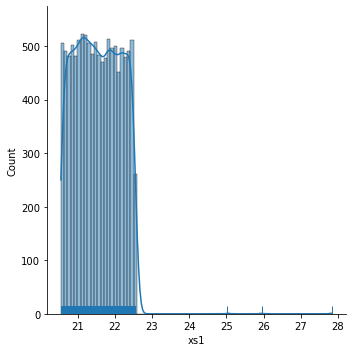

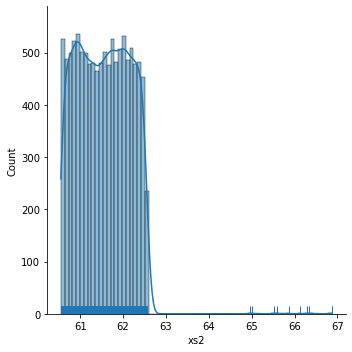

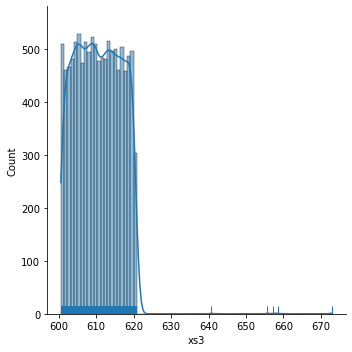

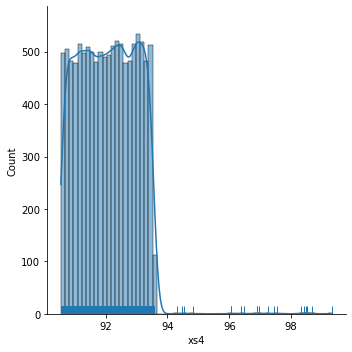

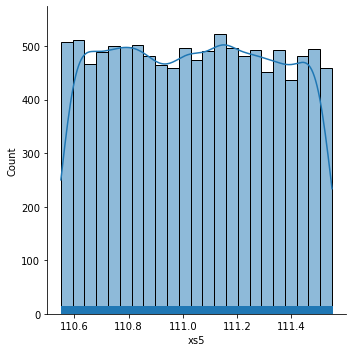

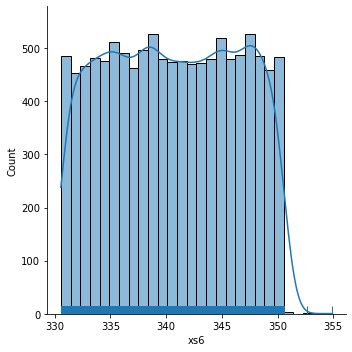

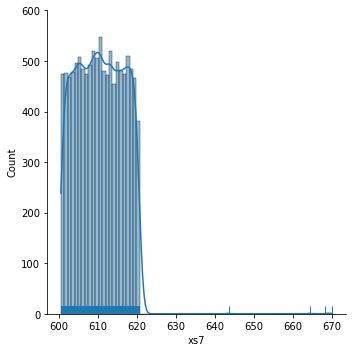

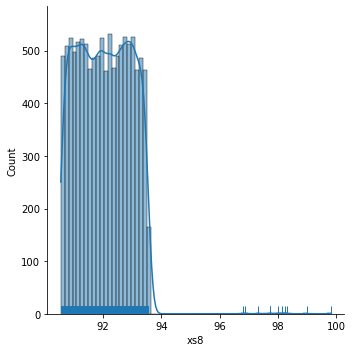

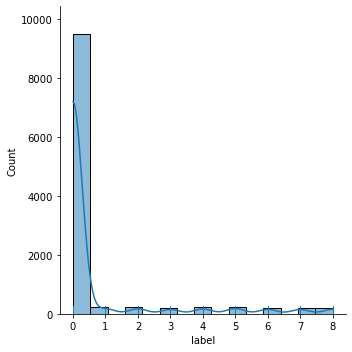

In [10]:
for i in ['xs1', 'xs2', 'xs3', 'xs4', 'xs5', 'xs6', 'xs7', 'xs8', 'label']:
    sns.displot(df[i], kde=True , rug=True)
    plt.show()
# No need to do log transform here as we dont need gaussian assumption for Decision Trees

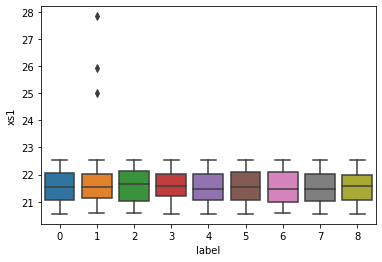

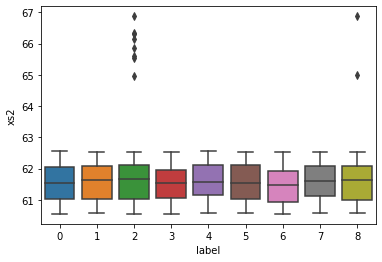

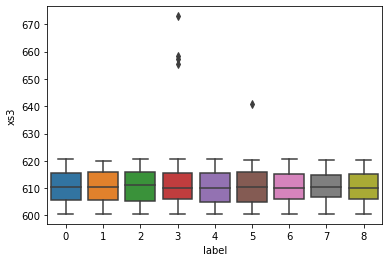

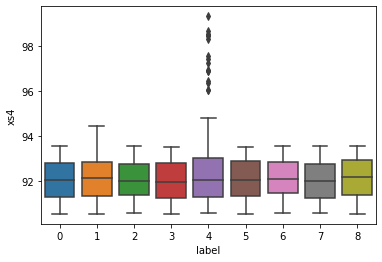

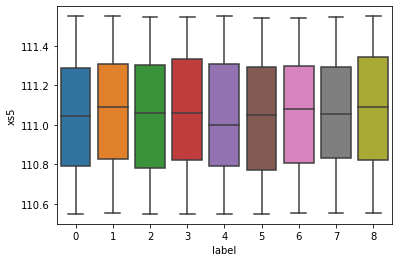

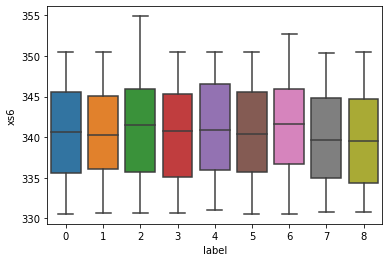

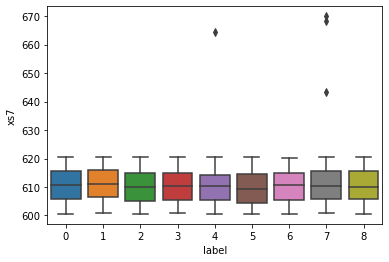

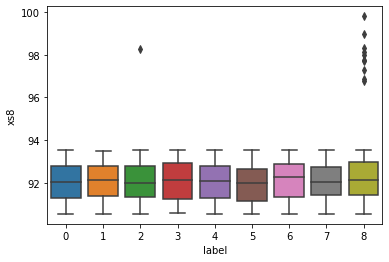

In [11]:
for i in ['xs1', 'xs2', 'xs3', 'xs4', 'xs5', 'xs6', 'xs7', 'xs8']:
    sns.boxplot(x='label',y=i,data=df)
    plt.show()

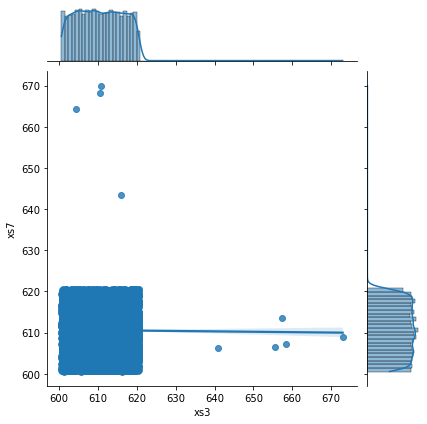

In [12]:
sns.jointplot(x='xs3',y='xs7',data=df,kind='reg')
# Discussed collinearity - it doesnt impact Decision tree model but be cautious while interpretation of the model

<AxesSubplot:xlabel='label', ylabel='count'>

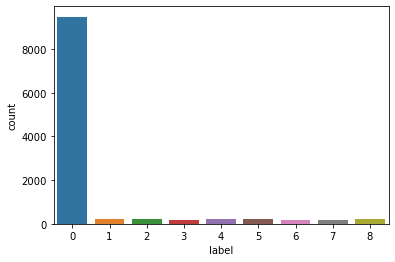

In [13]:
sns.countplot(x="label", data=df)

In [14]:
df.label.value_counts()

0    9477
5     235
1     222
2     221
4     216
8     201
6     195
3     192
7     189
Name: label, dtype: int64

# Handling Imbalance Data with IMBLEARN

In [15]:
X = df.drop('label',axis = 1)
Y = df['label']

In [16]:
print(X.shape,Y.shape)

(11148, 8) (11148,)


In [17]:
#pip install imblearn
# Install via for Anaconda Prompt run as Admin
# conda install -c conda-forge imbalanced-learn

In [18]:
from imblearn.under_sampling import NearMiss

nm = NearMiss()

In [19]:
#from imblearn.under_sampling import RandomUnderSampler

#nm = RandomUnderSampler(random_state=42)

In [20]:
X_res,y_res=nm.fit_sample(X,Y)
X_res.shape,y_res.shape

((1701, 8), (1701,))

In [21]:
from collections import Counter
print('Original dataset shape {}'.format(Counter(Y)))
print('Resampled dataset shape {}'.format(Counter(y_res)))

Original dataset shape Counter({0: 9477, 5: 235, 1: 222, 2: 221, 4: 216, 8: 201, 6: 195, 3: 192, 7: 189})
Resampled dataset shape Counter({0: 189, 1: 189, 2: 189, 3: 189, 4: 189, 5: 189, 6: 189, 7: 189, 8: 189})


In [22]:
X_res.tail()

,xs1,xs2,xs3,xs4,xs5,xs6,xs7,xs8
1696,22.240628,61.454101,616.914796,90.790072,111.379095,350.483933,617.847346,91.749449
1697,21.242052,61.331812,608.858297,92.305519,110.811343,342.949035,610.370951,96.783911
1698,22.147736,61.657896,603.664467,93.413806,111.449588,343.332315,619.705519,90.610212
1699,21.744980,61.814580,616.144272,92.924523,110.942382,332.661295,609.452850,97.306805
1700,20.958000,61.361369,616.496005,91.090099,110.665681,349.796821,610.078308,91.121168


In [23]:
y_res.tail()

1696    8
1697    8
1698    8
1699    8
1700    8
Name: label, dtype: int64

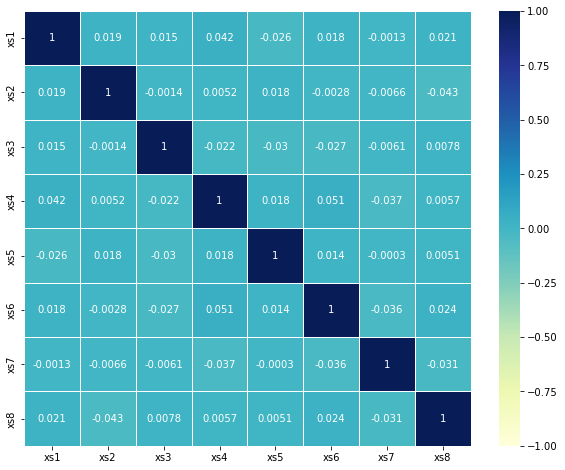

In [24]:
plt.figure(figsize=(10,8))
sns.heatmap(X_res.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=True,
            cmap="YlGnBu",
            vmin=-1,
            vmax=+1)
plt.show()

In [25]:
X_res.columns

Index(['xs1', 'xs2', 'xs3', 'xs4', 'xs5', 'xs6', 'xs7', 'xs8'], dtype='object')

In [26]:
df3 = X_res.join(y_res)

In [27]:
df3.tail()

,xs1,xs2,xs3,xs4,xs5,xs6,xs7,xs8,label
1696,22.240628,61.454101,616.914796,90.790072,111.379095,350.483933,617.847346,91.749449,8
1697,21.242052,61.331812,608.858297,92.305519,110.811343,342.949035,610.370951,96.783911,8
1698,22.147736,61.657896,603.664467,93.413806,111.449588,343.332315,619.705519,90.610212,8
1699,21.744980,61.814580,616.144272,92.924523,110.942382,332.661295,609.452850,97.306805,8
1700,20.958000,61.361369,616.496005,91.090099,110.665681,349.796821,610.078308,91.121168,8


In [28]:
df3 = df3.sample(frac = 1).reset_index(drop=True)

In [29]:
df3.tail()

,xs1,xs2,xs3,xs4,xs5,xs6,xs7,xs8,label
1696,21.698509,62.483290,606.688802,91.787905,111.024975,348.953797,613.969988,92.903470,2
1697,20.806796,60.642555,615.988613,91.559300,111.515465,338.434115,613.662776,93.235375,3
1698,20.626282,62.416385,603.445605,91.809411,110.952383,331.142198,611.333202,91.253366,8
1699,21.192728,61.911301,605.092406,92.774602,111.150822,344.310658,618.751993,92.132827,6
1700,22.179885,61.433470,603.376616,92.704675,110.779977,337.697972,607.482656,92.425445,1


In [30]:
df3.to_csv(r'C:\Users\Ganga Babu.M\Anomaly_Classifier_Model\shuffled.csv')

# Use pair plots on only variables with interesting correlations only
sns.pairplot(df3,hue='label',diag_kind ='kde',plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 4,vars = ['xs1', 'xs2', 'xs3', 'xs4', 'xs5', 'xs6', 'xs7', 'xs8'])
plt.show()

# Another way of visualizing pair plots for reference
grid = sns.PairGrid(data= df3,
                    vars = ['xs1', 'xs2', 'xs3', 'xs4', 'xs5', 'xs6', 'xs7', 'xs8'], height = 4)
grid = grid.map_upper(sns.scatterplot)
grid = grid.map_diag(plt.hist, bins = 10, color = 'darkred', edgecolor = 'k')
grid = grid.map_lower(sns.kdeplot)

In [31]:
# splitting data into training and test set for independent attributes
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test =train_test_split(df3.drop(['label'],axis=1), df3['label'], test_size=.3,
                                                   random_state=22)
X_train.shape,X_test.shape

((1190, 8), (511, 8))

# Create the decision tree model using “entropy” method of finding the split columns and fit it to training data.

In [32]:
# invoking the decision tree classifier function. Using 'entropy' method of finding the split columns. Other option 
# could be gini index.  Restricting the depth of the tree to 3 and size of the leaf node to 5 (no particular reason for 
# selecting this)
model_entropy=DecisionTreeClassifier(criterion='entropy')

In [33]:
model_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

Print the accuracy of the model & print the confusion matrix

In [34]:
model_entropy.score(X_train, y_train)  
# performance on train data
# If allow data set go to leaves then accuracy always go to 1, if change min leaf nodes then also behave similar to pruning;

1.0

In [35]:
acc = model_entropy.score(X_test, y_test) 
# performance on test data
acc

0.1232876712328767

Ref if required: Regularize/prune the decision tree by limiting the max. depth of trees and print the accuracy.

https://github.com/GreatLearningAIML1/chennai-oct-19-GangababuGB/blob/master/EnsembleTechnique/Session10_CaseStudyEnsemble_Sahil.ipynb

There is a high degree of overfitting in the model due to which the test accuracy drops drastically. This shows why decision trees are prone to overfitting.

Regularize/prune the decision tree by limiting the max. depth of trees and print the accuracy


In [36]:
#Model has been overfitted and perfomring poor on test data, try standardization.

# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

model_entropy.fit(X_train, y_train)

model_entropy.score(X_train, y_train)

acc = model_entropy.score(X_test, y_test) 
# performance on test data
acc

In [37]:
clf_pruned = DecisionTreeClassifier(criterion = "gini", random_state = 100,
                               max_depth=8, min_samples_leaf=12)
clf_pruned.fit(X_train, y_train)
# Regularize or prune, max step to 3, min smaples leaf -> less than 5 data pts not split;

DecisionTreeClassifier(max_depth=8, min_samples_leaf=12, random_state=100)

# Visualizing the tree

You might need to install pydotplus and graphviz packages for visualising the tree.

In [38]:
#pip install six

In [39]:
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

In [40]:
xvar = df3.drop(['label'], axis=1)
feature_cols = xvar.columns
feature_cols

Index(['xs1', 'xs2', 'xs3', 'xs4', 'xs5', 'xs6', 'xs7', 'xs8'], dtype='object')

In [41]:
y_test.value_counts()

4    69
6    63
7    59
8    57
1    56
2    54
5    52
0    51
3    50
Name: label, dtype: int64

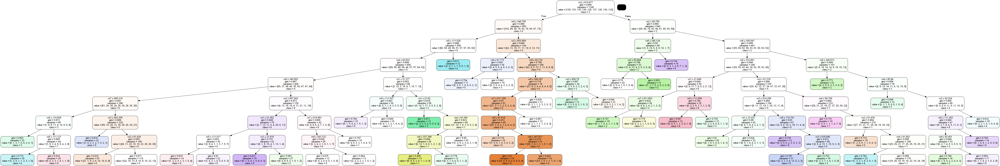

In [42]:
#Print the pruned tree
dot_data = StringIO()
export_graphviz(clf_pruned, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2','3','4','5','6','7','8'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Anomaly_pruned.png')
Image(graph.create_png())

In [43]:
preds_pruned = clf_pruned.predict(X_test)
preds_pruned_train = clf_pruned.predict(X_train)

In [44]:
print(accuracy_score(y_test,preds_pruned))
print(accuracy_score(y_train,preds_pruned_train))
# Pruning helped as test / training but perhaps getting to more underfitting now - cautious about it.

0.15264187866927592
0.31848739495798317


In [45]:
acc_DT = accuracy_score(y_test, preds_pruned)
acc_DT

0.15264187866927592

In [46]:
#Grid Search - To find the best parameters for Pruned Decision Tree
#X_train, X_test, y_train, y_test

from sklearn.model_selection import GridSearchCV
clf = DecisionTreeClassifier(random_state = 100)
grid_values = {'criterion' : ['gini', 'entropy'],
               'splitter' : ['best', 'random'],
               'max_depth' : np.arange(8,12),
               'min_samples_leaf' : np.arange(10,15)
              }
grid_clf_acc = GridSearchCV(clf, param_grid = grid_values)
grid_clf_acc.fit(X_train, y_train)

#Predict values based on new parameters
y_pred_acc = grid_clf_acc.predict(X_test)
# New Model Evaluation metrics 
print('Evaluation Score : ' + str(grid_clf_acc.score(X_test,y_test)))
print('Best Parameters : ' + str(grid_clf_acc.best_params_))

acc_GS = grid_clf_acc.score(X_test,y_test)

Evaluation Score : 0.15459882583170254
Best Parameters : {'criterion': 'gini', 'max_depth': 11, 'min_samples_leaf': 14, 'splitter': 'best'}


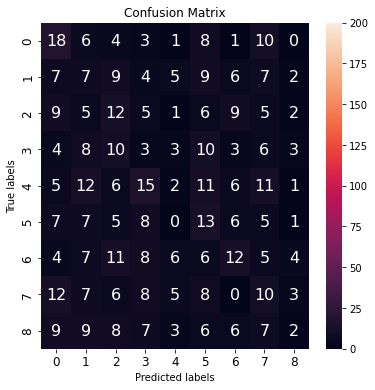

In [47]:
#Decision Tree (Grid Search) Confusion matrix
fig, ax = plt.subplots(nrows=1,ncols=1,figsize = (6,6))
sns.heatmap(confusion_matrix(y_test,y_pred_acc),annot=True,vmin=0,vmax=200,fmt='g', ax = ax,annot_kws={"size": 16})
# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0','1','2','3','4','5','6','7','8'],fontsize=12); 
ax.yaxis.set_ticklabels(['0','1','2','3','4','5','6','7','8'],fontsize=12);

In [48]:
y_test.value_counts()

4    69
6    63
7    59
8    57
1    56
2    54
5    52
0    51
3    50
Name: label, dtype: int64

In [49]:
# Another way to look at the precision - recall scores
y,levels = pd.factorize(df3['label'].astype(str))
print(metrics.classification_report(y_test,y_pred_acc,target_names=levels))

              precision    recall  f1-score   support

           5       0.24      0.35      0.29        51
           7       0.10      0.12      0.11        56
           8       0.17      0.22      0.19        54
           2       0.05      0.06      0.05        50
           1       0.08      0.03      0.04        69
           0       0.17      0.25      0.20        52
           3       0.24      0.19      0.21        63
           6       0.15      0.17      0.16        59
           4       0.11      0.04      0.05        57

    accuracy                           0.15       511
   macro avg       0.15      0.16      0.15       511
weighted avg       0.15      0.15      0.14       511



In [50]:
## Calculating feature importance used for interpretation
feat_importance = clf_pruned.tree_.compute_feature_importances(normalize=False)
feat_imp_dict = dict(zip(feature_cols, clf_pruned.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
xs6,0.200474
xs3,0.153525
xs5,0.135331
xs1,0.120842
xs2,0.108053
xs4,0.105154
xs7,0.090458
xs8,0.086163


In [51]:
#Store the accuracy results for each model in a dataframe for final comparison
resultsDf = pd.DataFrame({'Method':['Decision Tree','Pruned Decision Tree','Grid Search Decision Tree'], 'accuracy': [acc,acc_DT,acc_GS]})
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree,0.123288
1,Pruned Decision Tree,0.152642
2,Grid Search Decision Tree,0.154599


In [52]:
# You can run the model on the new data coming in every day
test = df3.sample(n = 10,replace=True,random_state=100).drop(['label'],axis=1)
test.reset_index(inplace=True,drop=True)

In [53]:
# Make predictions based on your final mode 
predictions = grid_clf_acc.predict(test)
pd.DataFrame(predictions)

,0
0,1
1,4
2,0
3,1
4,0
5,0
6,8
7,4
8,3
9,2


In [54]:
pd.concat([test,pd.DataFrame(predictions)], axis=1, join='inner')

,xs1,xs2,xs3,xs4,xs5,xs6,xs7,xs8,0
0,22.349264,62.379254,616.852485,92.960825,111.291237,333.717452,617.746975,91.216267,1
1,21.428463,62.486264,619.142288,90.905214,110.800742,334.446628,606.174871,90.926664,4
2,21.270262,61.713340,605.318949,91.011939,110.900532,336.131413,617.574542,91.453409,0
3,21.306089,61.905384,615.012104,91.377948,111.090616,341.111913,611.860591,92.797648,1
4,21.855992,62.018330,608.868076,92.778763,110.720329,332.291406,608.077376,92.400731,0
5,22.148926,62.067608,605.877598,92.986364,110.885323,347.848371,611.159844,92.212137,0
6,21.596276,62.364450,603.279863,92.833104,111.209804,337.960185,605.010786,90.845974,8
7,21.348214,62.159665,602.884517,90.844117,110.930999,331.230415,604.219769,93.274733,4
8,21.600862,60.647191,602.751869,93.517158,111.301877,344.598549,614.906132,90.662889,3
9,21.566236,62.488113,617.686380,93.040266,110.623328,330.737662,600.728127,91.077250,2


# References -

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

https://www.tutorialspoint.com/scikit_learn/scikit_learn_decision_trees.htm

https://scikit-learn.org/stable/modules/tree.html

https://towardsdatascience.com/stop-saying-precision-and-recall-to-business-leaders-f17082ab5052

# Apply the Random forest model and print the accuracy of Random forest Model

In [55]:
# Initiate Random Forest Model
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50,oob_score=True,random_state=22)
rfcl = rfcl.fit(X_train, y_train)

In [56]:
# Make predictions and calculate accuracy
pred_RF = rfcl.predict(X_test)
acc_RF = accuracy_score(y_test, pred_RF)
acc_RF

0.15655577299412915

In [57]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree,0.123288
1,Pruned Decision Tree,0.152642
2,Grid Search Decision Tree,0.154599
0,Random Forest,0.156556


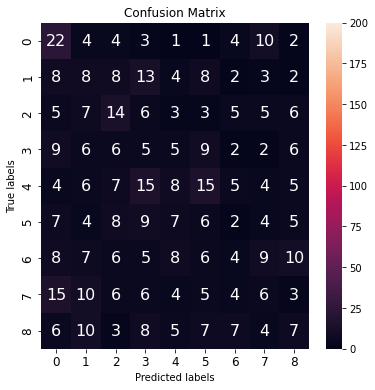

In [58]:
fig, ax = plt.subplots(nrows=1,ncols=1,figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_RF),annot=True,vmin=0,vmax=200,fmt='g', ax = ax,annot_kws={"size": 16})
# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0','1','2','3','4','5','6','7','8'],fontsize=12); 
ax.yaxis.set_ticklabels(['0','1','2','3','4','5','6','7','8'],fontsize=12);

In [59]:
## Classification Report
y,levels = pd.factorize(df3['label'].astype(str))
print(metrics.classification_report(y_test, pred_RF,target_names=levels))

              precision    recall  f1-score   support

           5       0.26      0.43      0.33        51
           7       0.13      0.14      0.14        56
           8       0.23      0.26      0.24        54
           2       0.07      0.10      0.08        50
           1       0.18      0.12      0.14        69
           0       0.10      0.12      0.11        52
           3       0.11      0.06      0.08        63
           6       0.13      0.10      0.11        59
           4       0.15      0.12      0.14        57

    accuracy                           0.16       511
   macro avg       0.15      0.16      0.15       511
weighted avg       0.15      0.16      0.15       511



In [60]:
# Binarize y test(5,6,7) classes to (1,0,0) - (0,0,1) classes to generate AUC ROC Curves 
from sklearn.preprocessing import label_binarize
y_test_bin = label_binarize(y_test, classes=[0,1,2,3,4,5,6,7,8])
n_classes = y_test_bin.shape[1]

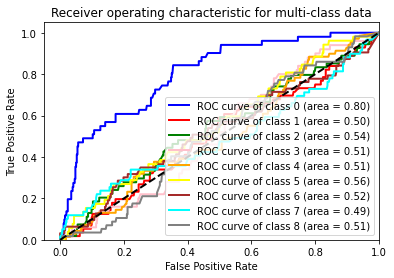

In [61]:
#Generate AUC ROC Curves

from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve,auc


# classifier
clf = OneVsRestClassifier(RandomForestClassifier(n_estimators = 50,random_state=22))
y_score = clf.fit(X_train, y_train).predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = ['blue', 'red', 'green','pink','orange','yellow','brown','aqua','grey']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

In [62]:
# Visualize Random Forest Trees
trees = rfcl.estimators_
display(trees)

[DecisionTreeClassifier(max_features='auto', random_state=895331189),
 DecisionTreeClassifier(max_features='auto', random_state=867424388),
 DecisionTreeClassifier(max_features='auto', random_state=2068804396),
 DecisionTreeClassifier(max_features='auto', random_state=990018496),
 DecisionTreeClassifier(max_features='auto', random_state=1806197092),
 DecisionTreeClassifier(max_features='auto', random_state=590468454),
 DecisionTreeClassifier(max_features='auto', random_state=1542674934),
 DecisionTreeClassifier(max_features='auto', random_state=1202737643),
 DecisionTreeClassifier(max_features='auto', random_state=735133268),
 DecisionTreeClassifier(max_features='auto', random_state=1489103752),
 DecisionTreeClassifier(max_features='auto', random_state=1455409631),
 DecisionTreeClassifier(max_features='auto', random_state=1689254372),
 DecisionTreeClassifier(max_features='auto', random_state=1161929693),
 DecisionTreeClassifier(max_features='auto', random_state=1007761042),
 DecisionTr

In [63]:
print("Number of trees is ",len(trees))

Number of trees is  50


In [64]:
print("Number of nodes per tree is ")

i = 0
for tree_in_forest in trees:
    print(tree_in_forest.tree_.node_count)
    i = i + 1

Number of nodes per tree is 
997
1015
1041
985
1027
1003
1011
989
985
1017
995
999
983
1015
1023
989
1007
999
1021
995
955
1051
983
1009
1017
963
1035
1027
995
1013
1011
1031
1005
973
985
987
981
1003
965
1021
1013
1003
1011
967
1011
999
1017
1023
985
1021


In [65]:
tree_in_forest = trees[1]

In [67]:
# Plot tree using dot function as before
dot_data = StringIO()
export_graphviz(tree_in_forest, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2','3','4','5','6','7','8'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Anomaly_pruned.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.691185 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.691185 to fit



# Apply Bagging Classifier Algorithm and print the accuracy.

In [68]:
# Initiate Bagging Classifier
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier

bgcl = BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=22)
bgcl = bgcl.fit(X_train, y_train)

# Use different base classifiers; Ex, base_estimator = KNeighborsClassifier()

In [69]:
# Make predictions and calculate accuracy
pred_BG = bgcl.predict(X_test)
acc_BG = accuracy_score(y_test, pred_BG)
acc_BG

0.1487279843444227

In [70]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_BG]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree,0.123288
1,Pruned Decision Tree,0.152642
2,Grid Search Decision Tree,0.154599
0,Random Forest,0.156556
0,Bagging,0.148728


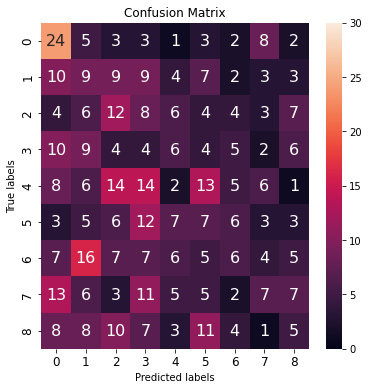

In [71]:
## Confusion Matrix
fig, ax = plt.subplots(nrows=1,ncols=1,figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_BG),annot=True,vmin=0,vmax=30,fmt='g', ax = ax,annot_kws={"size": 16})
# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0','1','2','3','4','5','6','7','8'],fontsize=12); 
ax.yaxis.set_ticklabels(['0','1','2','3','4','5','6','7','8'],fontsize=12);

In [72]:
## Classification Report
y,levels = pd.factorize(df3['label'].astype(str))
print(metrics.classification_report(y_test, pred_BG,target_names=levels))

              precision    recall  f1-score   support

           5       0.28      0.47      0.35        51
           7       0.13      0.16      0.14        56
           8       0.18      0.22      0.20        54
           2       0.05      0.08      0.06        50
           1       0.05      0.03      0.04        69
           0       0.12      0.13      0.13        52
           3       0.17      0.10      0.12        63
           6       0.19      0.12      0.15        59
           4       0.13      0.09      0.10        57

    accuracy                           0.15       511
   macro avg       0.14      0.16      0.14       511
weighted avg       0.14      0.15      0.14       511



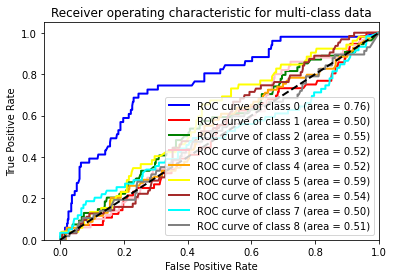

In [73]:
## AUC ROC Curve
# classifier
clf = OneVsRestClassifier(BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=22))
y_score = clf.fit(X_train, y_train).predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
#colors = ['blue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# Apply Adaboost Ensemble Algorithm for the same data and print the accuracy.

In [74]:
# Initiate adaboost classifier
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators = 100, learning_rate=0.1, random_state=22)
abcl = abcl.fit(X_train, y_train)

In [75]:
# Make predictions and calculate accuracy
pred_AB =abcl.predict(X_test)
acc_AB = accuracy_score(y_test, pred_AB)

In [76]:
tempResultsDf = pd.DataFrame({'Method':['Adaboost'], 'accuracy': [acc_AB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree,0.123288
1,Pruned Decision Tree,0.152642
2,Grid Search Decision Tree,0.154599
0,Random Forest,0.156556
0,Bagging,0.148728
0,Adaboost,0.148728


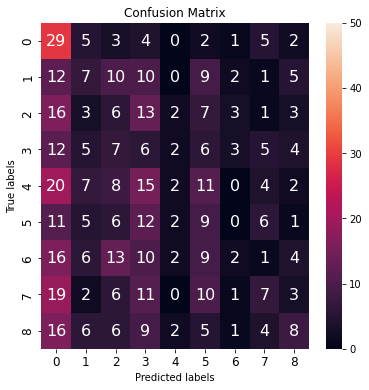

In [77]:
## Confusion Matrix
fig, ax = plt.subplots(nrows=1,ncols=1,figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_AB),annot=True,vmin=0,vmax=50,fmt='g', ax = ax,annot_kws={"size": 16})
# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0','1','2','3','4','5','6','7','8'],fontsize=12); 
ax.yaxis.set_ticklabels(['0','1','2','3','4','5','6','7','8'],fontsize=12);

In [78]:
## Classification Report
y,levels = pd.factorize(df['label'].astype(str))
print(metrics.classification_report(y_test, pred_AB,target_names=levels))

              precision    recall  f1-score   support

           0       0.19      0.57      0.29        51
           3       0.15      0.12      0.14        56
           7       0.09      0.11      0.10        54
           2       0.07      0.12      0.09        50
           1       0.17      0.03      0.05        69
           4       0.13      0.17      0.15        52
           5       0.15      0.03      0.05        63
           6       0.21      0.12      0.15        59
           8       0.25      0.14      0.18        57

    accuracy                           0.15       511
   macro avg       0.16      0.16      0.13       511
weighted avg       0.16      0.15      0.13       511



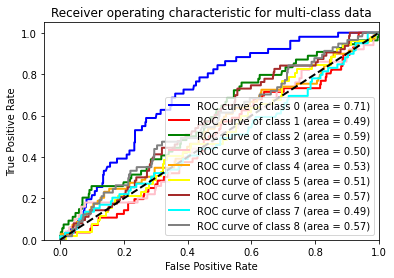

In [79]:
## AUC ROC Curve
# classifier
clf = AdaBoostClassifier(n_estimators = 100, learning_rate=0.1, random_state=22)
y_score = clf.fit(X_train, y_train).predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
#colors = ['blue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

In [80]:
# Visualize Adaboost Trees
trees_ab = abcl.estimators_
display(trees_ab)

[DecisionTreeClassifier(max_depth=1, random_state=895331189),
 DecisionTreeClassifier(max_depth=1, random_state=867424388),
 DecisionTreeClassifier(max_depth=1, random_state=2068804396),
 DecisionTreeClassifier(max_depth=1, random_state=990018496),
 DecisionTreeClassifier(max_depth=1, random_state=1806197092),
 DecisionTreeClassifier(max_depth=1, random_state=590468454),
 DecisionTreeClassifier(max_depth=1, random_state=1542674934),
 DecisionTreeClassifier(max_depth=1, random_state=1202737643),
 DecisionTreeClassifier(max_depth=1, random_state=735133268),
 DecisionTreeClassifier(max_depth=1, random_state=1489103752),
 DecisionTreeClassifier(max_depth=1, random_state=1455409631),
 DecisionTreeClassifier(max_depth=1, random_state=1689254372),
 DecisionTreeClassifier(max_depth=1, random_state=1161929693),
 DecisionTreeClassifier(max_depth=1, random_state=1007761042),
 DecisionTreeClassifier(max_depth=1, random_state=820516366),
 DecisionTreeClassifier(max_depth=1, random_state=48947964),


In [81]:
print("Number of trees is ",len(trees_ab))

Number of trees is  100


In [83]:
'''
print("Number of nodes per tree is ")

i = 0
for tree_in_forest in trees_ab:
    print(tree_in_forest.tree_.node_count)
    i = i + 1
    '''

'\nprint("Number of nodes per tree is ")\n\ni = 0\nfor tree_in_forest in trees_ab:\n    print(tree_in_forest.tree_.node_count)\n    i = i + 1\n    '

In [84]:
tree_in_forest_ab = trees_ab[1]

# Plot tree using dot function as before
dot_data = StringIO()
export_graphviz(tree_in_forest_ab, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('wines_pruned.png')
Image(graph.create_png())

Apply GradientBoost Classifier Algorithm for the same data and print the accuracy

In [85]:
# Initiate Gradiant Boosting Classifier
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22)
gbcl = gbcl.fit(X_train, y_train)

In [86]:
# Make predictions and calculate accuracy on test data set
pred_GB = gbcl.predict(X_test)
acc_GB = accuracy_score(y_test, pred_GB)

In [87]:
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost'], 'accuracy': [acc_GB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree,0.123288
1,Pruned Decision Tree,0.152642
2,Grid Search Decision Tree,0.154599
0,Random Forest,0.156556
0,Bagging,0.148728
0,Adaboost,0.148728
0,Gradient Boost,0.146771


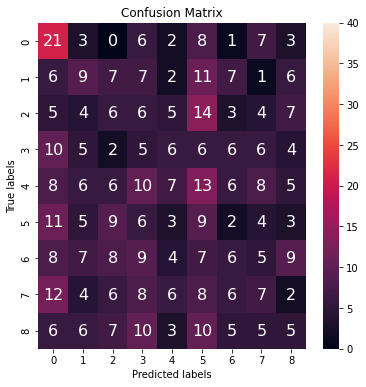

In [88]:
## Confusion Matrix
fig, ax = plt.subplots(nrows=1,ncols=1,figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_GB),annot=True,vmin=0,vmax=40,fmt='g', ax = ax,annot_kws={"size": 16})
# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 


In [89]:
## Classification Report
y,levels = pd.factorize(df3['label'].astype(str))
print(metrics.classification_report(y_test, pred_GB,target_names=levels))

              precision    recall  f1-score   support

           5       0.24      0.41      0.30        51
           7       0.18      0.16      0.17        56
           8       0.12      0.11      0.11        54
           2       0.07      0.10      0.09        50
           1       0.18      0.10      0.13        69
           0       0.10      0.17      0.13        52
           3       0.14      0.10      0.11        63
           6       0.15      0.12      0.13        59
           4       0.11      0.09      0.10        57

    accuracy                           0.15       511
   macro avg       0.15      0.15      0.14       511
weighted avg       0.15      0.15      0.14       511



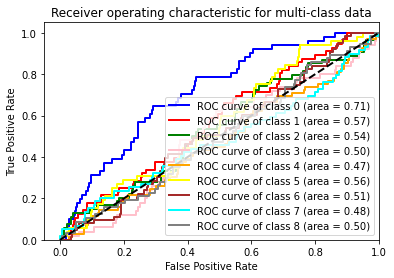

In [90]:
## AUC ROC Curve
clf = OneVsRestClassifier(GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22))
y_score = clf.fit(X_train, y_train).predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
#colors = ['blue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# Helpful Links

Helpful Links
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.BaggingClassifier.html

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html

Stacking

In [91]:
from sklearn.ensemble import StackingClassifier
from sklearn.neighbors import KNeighborsClassifier

In [92]:
# Create Base Learners for Stacking that is Random Forest and GBM
base_learners = [
                 ('model_1', RandomForestClassifier(n_estimators = 50,random_state=22)),
                 ('model_2', GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1,random_state=22))             
                ]

In [93]:
# Initialize Stacking Classifier with the Meta Learner
clf_stack = StackingClassifier(estimators=base_learners, final_estimator=GradientBoostingClassifier(random_state=22))

In [94]:
# Extract score
clf_stack.fit(X_train, y_train)

StackingClassifier(estimators=[('model_1',
                                RandomForestClassifier(n_estimators=50,
                                                       random_state=22)),
                               ('model_2',
                                GradientBoostingClassifier(n_estimators=50,
                                                           random_state=22))],
                   final_estimator=GradientBoostingClassifier(random_state=22))

In [95]:
# Making predictions using Staking models
pred_stack = clf_stack.predict(X_test)

In [96]:
# Calculating accuracy on test data set
acc_stack = clf_stack.score(X_test, y_test)

In [97]:
tempResultsDf = pd.DataFrame({'Method':['Stacking RF&GB'], 'accuracy': [acc_stack]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree,0.123288
1,Pruned Decision Tree,0.152642
2,Grid Search Decision Tree,0.154599
0,Random Forest,0.156556
0,Bagging,0.148728
0,Adaboost,0.148728
0,Gradient Boost,0.146771
0,Stacking RF&GB,0.160470


<AxesSubplot:>

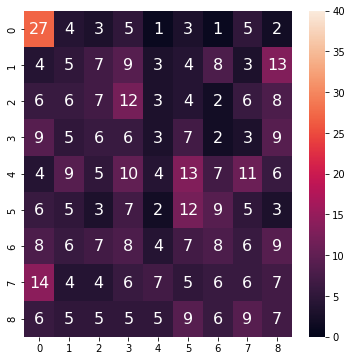

In [98]:
## Confusion Matrix
fig, ax = plt.subplots(nrows=1,ncols=1,figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_stack),annot=True,vmin=0,vmax=40,fmt='g', ax = ax,annot_kws={"size": 16})

In [99]:
## Classification Report
y,levels = pd.factorize(df3['label'].astype(str))
print(metrics.classification_report(y_test, pred_stack,target_names=levels))

              precision    recall  f1-score   support

           5       0.32      0.53      0.40        51
           7       0.10      0.09      0.10        56
           8       0.15      0.13      0.14        54
           2       0.09      0.12      0.10        50
           1       0.12      0.06      0.08        69
           0       0.19      0.23      0.21        52
           3       0.16      0.13      0.14        63
           6       0.11      0.10      0.11        59
           4       0.11      0.12      0.12        57

    accuracy                           0.16       511
   macro avg       0.15      0.17      0.15       511
weighted avg       0.15      0.16      0.15       511



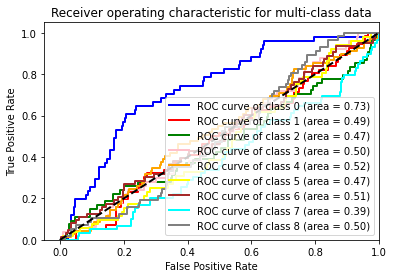

In [100]:
# AUC ROC Curves
# classifier
clf = OneVsRestClassifier(StackingClassifier(estimators=base_learners, final_estimator=GradientBoostingClassifier(random_state=22)))
y_score = clf.fit(X_train, y_train).predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
#colors = ['blue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for multi-class data')
plt.legend(loc="lower right")
plt.show()

# GridSearchCV

In [101]:
# Improving best model using GridSearch CV based on Random Forest from all the models run above
from sklearn.model_selection import GridSearchCV

clf_RF = RandomForestClassifier(random_state=22)
grid_values = {'n_estimators':[50,100,150],
               'max_features':['auto','sqrt','log2']
              }
grid_clf_acc_RF = GridSearchCV(clf_RF, param_grid = grid_values)
grid_clf_acc_RF.fit(X_train, y_train)

#Predict values based on new parameters
y_pred_acc_RF = grid_clf_acc_RF.predict(X_test)
# New Model Evaluation metrics 
print('Evaluation Score : ' + str(grid_clf_acc_RF.score(X_test,y_test)))
print('Best Parameters : ' + str(grid_clf_acc_RF.best_params_))

acc_GS_RF = grid_clf_acc_RF.score(X_test,y_test)
acc_GS_RF

Evaluation Score : 0.17416829745596868
Best Parameters : {'max_features': 'auto', 'n_estimators': 150}


0.17416829745596868

In [102]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest with Grid Search'], 'accuracy': [acc_GS_RF]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree,0.123288
1,Pruned Decision Tree,0.152642
2,Grid Search Decision Tree,0.154599
0,Random Forest,0.156556
0,Bagging,0.148728
0,Adaboost,0.148728
0,Gradient Boost,0.146771
0,Stacking RF&GB,0.160470
0,Random Forest with Grid Search,0.174168


In [103]:
# Feature Importance
feat_importance = rfcl.feature_importances_
feat_imp_dict = dict(zip(feature_cols, rfcl.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
xs3,0.130926
xs6,0.128257
xs2,0.126709
xs1,0.125586
xs8,0.124445
xs5,0.123605
xs7,0.122328
xs4,0.118143


# Model Interpretation using Lime

In [104]:
import lime
import lime.lime_tabular

In [105]:
df3.drop('label',axis=1).columns

Index(['xs1', 'xs2', 'xs3', 'xs4', 'xs5', 'xs6', 'xs7', 'xs8'], dtype='object')

In [133]:
# Using Grid Search algo for model interpretation as it turned out to be best algorithm
# clf_stack
# grid_clf_acc_RF
predict_fn_rf = lambda x: grid_clf_acc_RF.predict_proba(x).astype(float)
X = X_train.values

In [134]:
explainer = lime.lime_tabular.LimeTabularExplainer(X,feature_names = df3.drop('label',axis=1).columns,class_names=['0','1','2','3','4','5','6','7','8'],kernel_width=5)

In [135]:
X_test.iloc[105]

xs1     22.134947
xs2     60.786604
xs3    609.142675
xs4     92.696432
xs5    111.526181
xs6    336.322046
xs7    603.923070
xs8     92.107053
Name: 1530, dtype: float64

In [136]:
#22.134947	60.786604	609.142675	92.696432	111.526181	336.322046	603.92307	92.107053	2

In [137]:
y_test.values[105]

2

In [138]:
# Explain which features are leading to which class prediction
choosen_instance = X_test.values[105]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=8,labels=[0,1,2,3,4,5,6,7,8])
exp.show_in_notebook(show_all=True)

In [139]:
y_test.values[110]

1

In [140]:
choosen_instance = X_test.values[110]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=10,labels=[0,1,2,3,4,5,6,7,8])
exp.show_in_notebook(show_all=False)

In [141]:
y_test.values[14]

8

In [144]:
choosen_instance = X_test.values[14]
exp = explainer.explain_instance(choosen_instance, predict_fn_rf,num_features=8,labels=[0,1,2,3,4,5,6,7,8])
exp.show_in_notebook(show_all=True)

Lime Explaination
https://arxiv.org/pdf/1602.04938.pdf